In [1]:
import arviz
import matplotlib.pyplot as plt
import pandas as pd
from utils.model_builder import ModelBuilder
from utils.posteriorplots import predictive_plot, retrodictive_plot

In [2]:
arviz.style.use("arviz-darkgrid")

In [3]:
%load_ext autoreload
%autoreload 2

In [99]:
TEST_CUTOFF = pd.Timedelta(8, "W")

election_date = "2017-04-23"
mb = ModelBuilder(
    election_to_predict=election_date,
    test_cutoff=TEST_CUTOFF,
    variance_weight=[0.1, 0.4, 0.5], # [0.1, 0.3, 0.6], [0.2, 0.5, 0.3],
)
hierarchical_dm = mb.build_model()

/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)


In [100]:
idata_hierarchical_dm = mb.sample_all(
    var_names=[
        "latent_popularity",
        "latent_pop_t0",
        "R",
        "noisy_popularity",
        "N_approve",
    ],
)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, lsd_party_effect_1, lsd_intercept, incumbency_popularity_effect, incumbency_effect, gas_effect, unemployment_effect, house_election_effects_raw, house_election_effects_sd, poll_election_bias, poll_election_bias_sd, house_effects, house_effects_sd, poll_bias, poll_bias_sd, election_party_intercept, election_party_intercept_sd, party_intercept, party_intercept_sd]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1389 seconds.


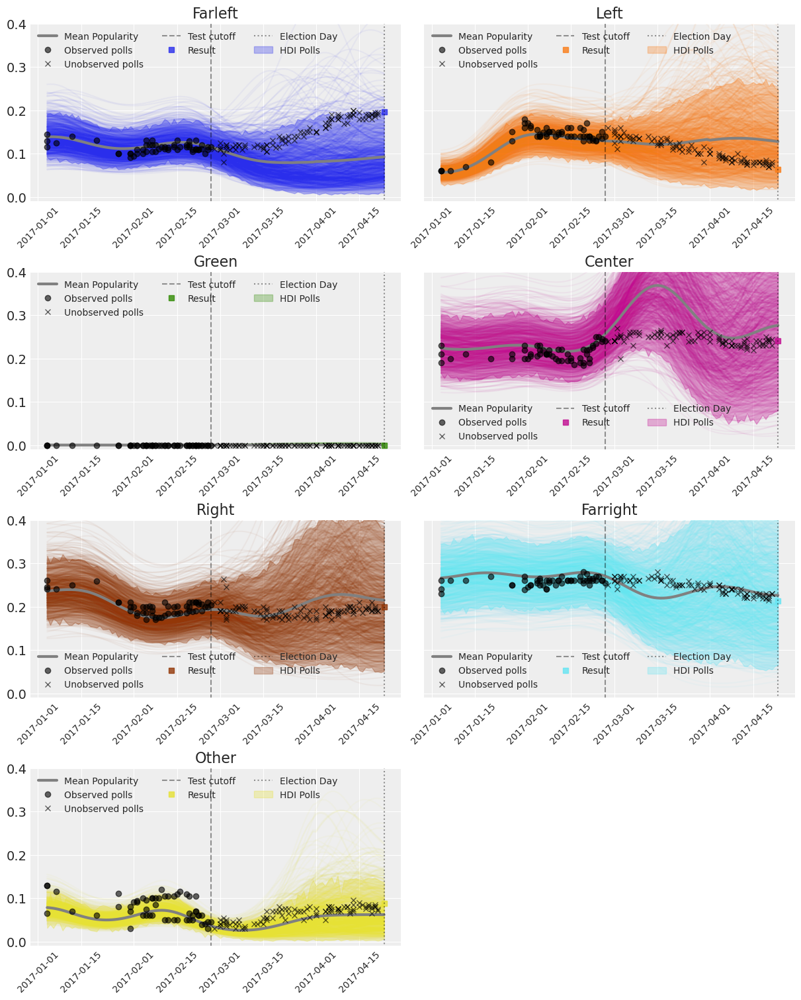

In [101]:
election_forecast = mb.forecast_election(idata_hierarchical_dm)

results = mb.results_raw.copy()
polls_train = mb.polls_train.copy()
polls_test = mb.polls_test.copy()
predictive_plot(
    election_forecast,
    mb.parties_complete,
    election_date,
    results[results.dateelection == election_date],
    polls_train[polls_train.dateelection == election_date],
    polls_test[polls_test.dateelection == election_date],
    TEST_CUTOFF,
)

## Model with socio-eco predictors

TEST_CUTOFF = Timedelta('56 days 00:00:00')



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, lsd_party_effect_1, lsd_intercept, incumbency_popularity_effect, popularity_effect, gas_effect, unemployment_effect, house_election_effects_raw, house_election_effect_sd, house_effects, election_party_intercept, election_party_intercept_sd, party_intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1031 seconds.
The number of effective samples is smaller than 25% for some parameters.


TEST_CUTOFF = Timedelta('42 days 00:00:00')



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, lsd_party_effect_1, lsd_intercept, incumbency_popularity_effect, popularity_effect, gas_effect, unemployment_effect, house_election_effects_raw, house_election_effect_sd, house_effects, election_party_intercept, election_party_intercept_sd, party_intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1114 seconds.
The number of effective samples is smaller than 25% for some parameters.


TEST_CUTOFF = Timedelta('28 days 00:00:00')



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, lsd_party_effect_1, lsd_intercept, incumbency_popularity_effect, popularity_effect, gas_effect, unemployment_effect, house_election_effects_raw, house_election_effect_sd, house_effects, election_party_intercept, election_party_intercept_sd, party_intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1172 seconds.
The number of effective samples is smaller than 25% for some parameters.


TEST_CUTOFF = Timedelta('14 days 00:00:00')



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, lsd_party_effect_1, lsd_intercept, incumbency_popularity_effect, popularity_effect, gas_effect, unemployment_effect, house_election_effects_raw, house_election_effect_sd, house_effects, election_party_intercept, election_party_intercept_sd, party_intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1214 seconds.
The number of effective samples is smaller than 25% for some parameters.


TEST_CUTOFF = None



/Users/alex_andorra/repos/pollsposition/models/presidential-elections/utils/model_builder.py:135: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df["countdown"] = dates_to_idx(df["date"], reference_date=date).astype(int)
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [concentration, election_party_time_coefs, party_time_coefs_raw, lsd_election_party_raw, lsd_election_party_sd, lsd_election_effect, lsd_party_effect_2, lsd_party_effect_1, lsd_intercept, incumbency_popularity_effect, popularity_effect, gas_effect, unemployment_effect, house_election_effects_raw, house_election_effect_sd, house_effects, election_party_intercept, election_party_intercept_sd, party_intercept]


Sampling 4 chains for 1_000 tune and 2_000 draw iterations (4_000 + 8_000 draws total) took 1258 seconds.
The number of effective samples is smaller than 25% for some parameters.


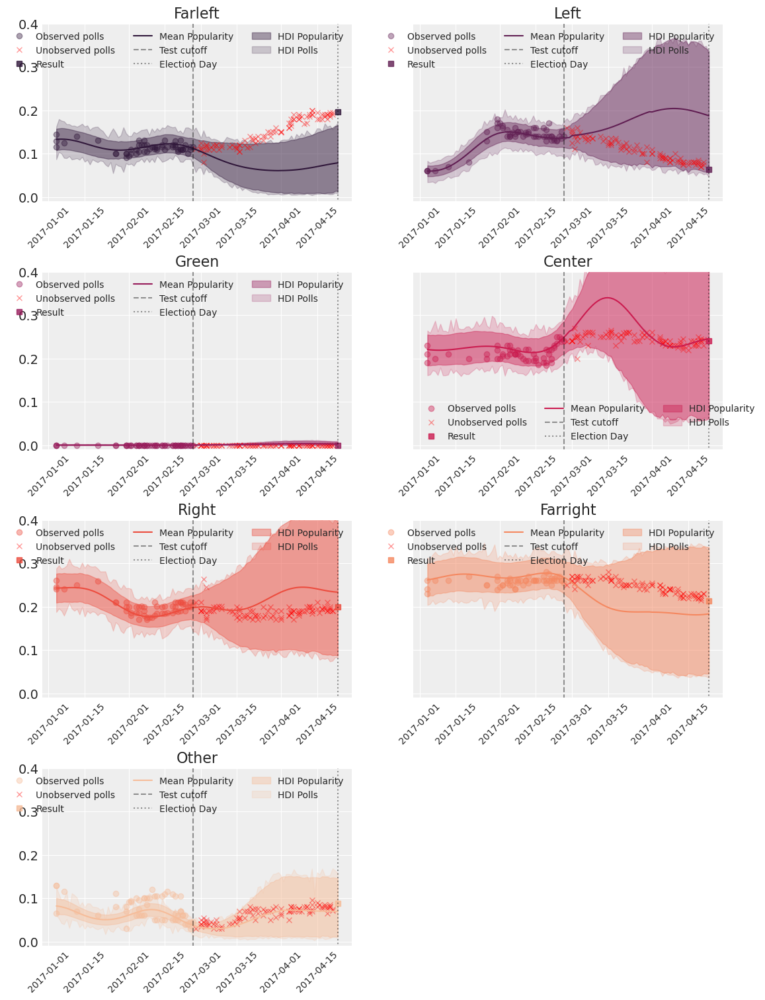

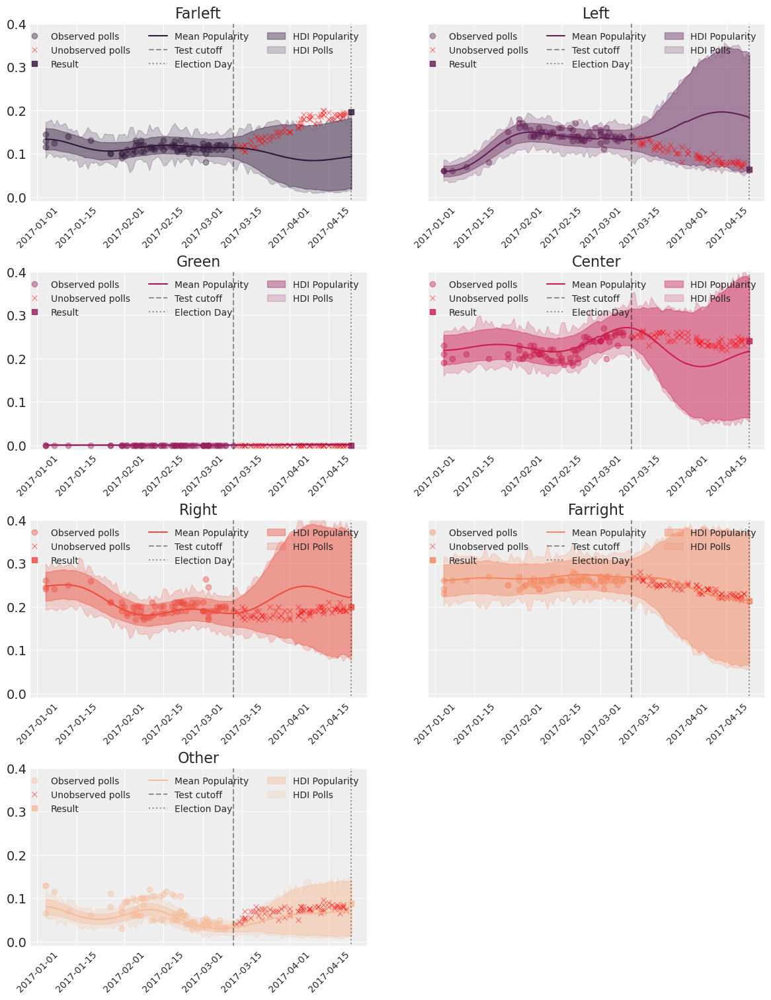

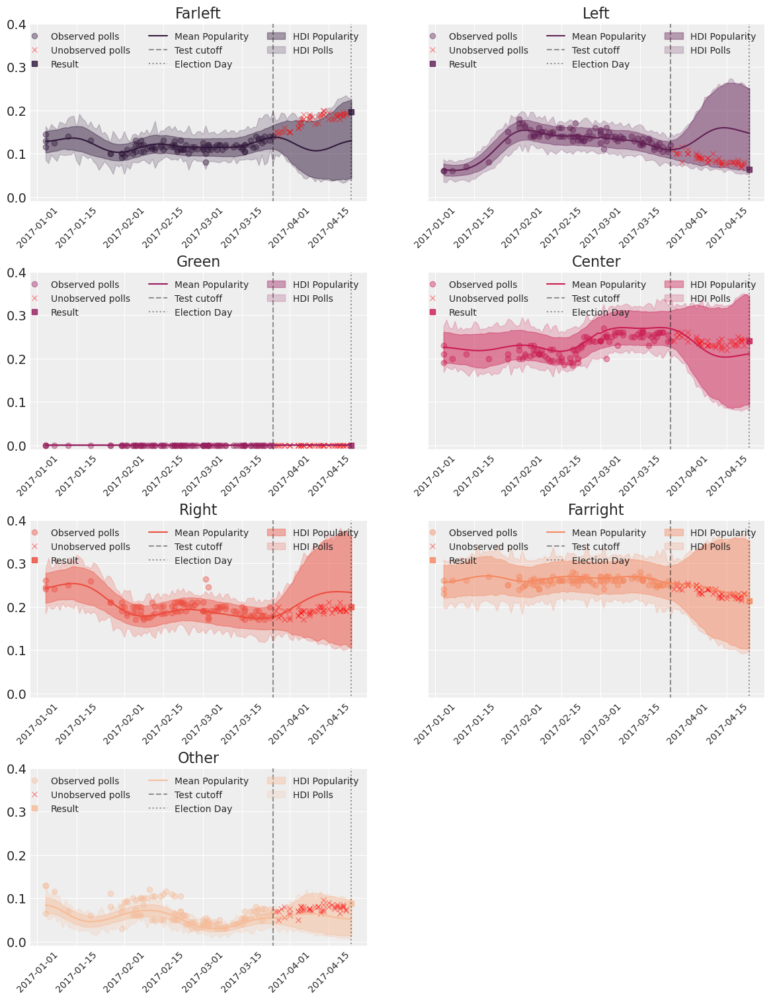

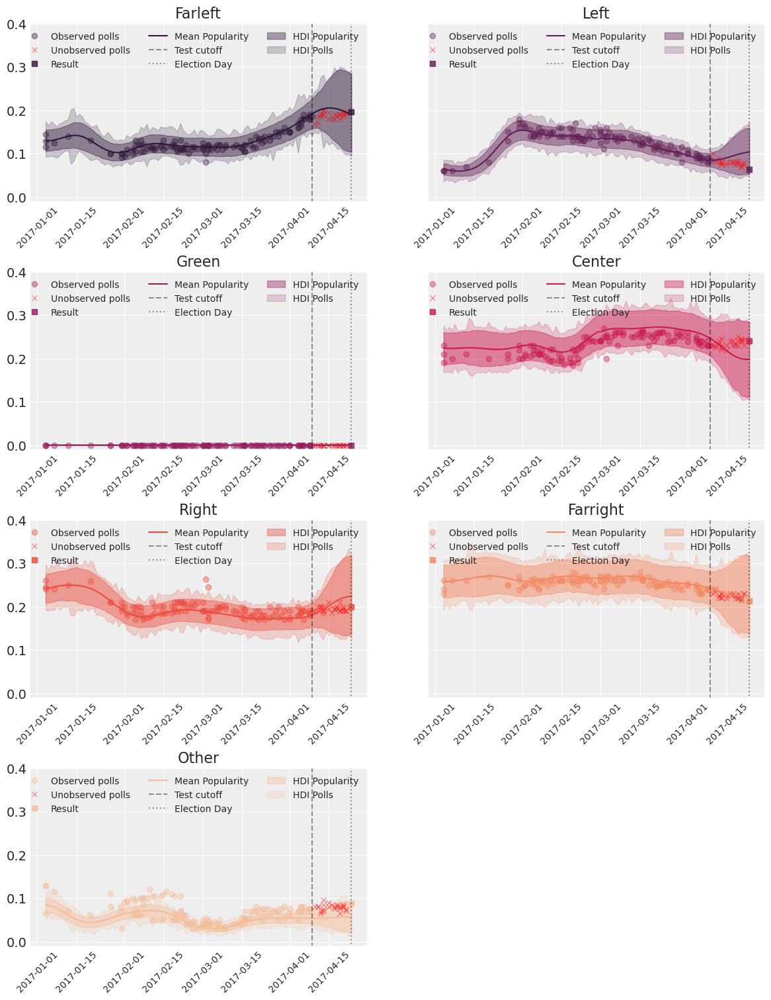

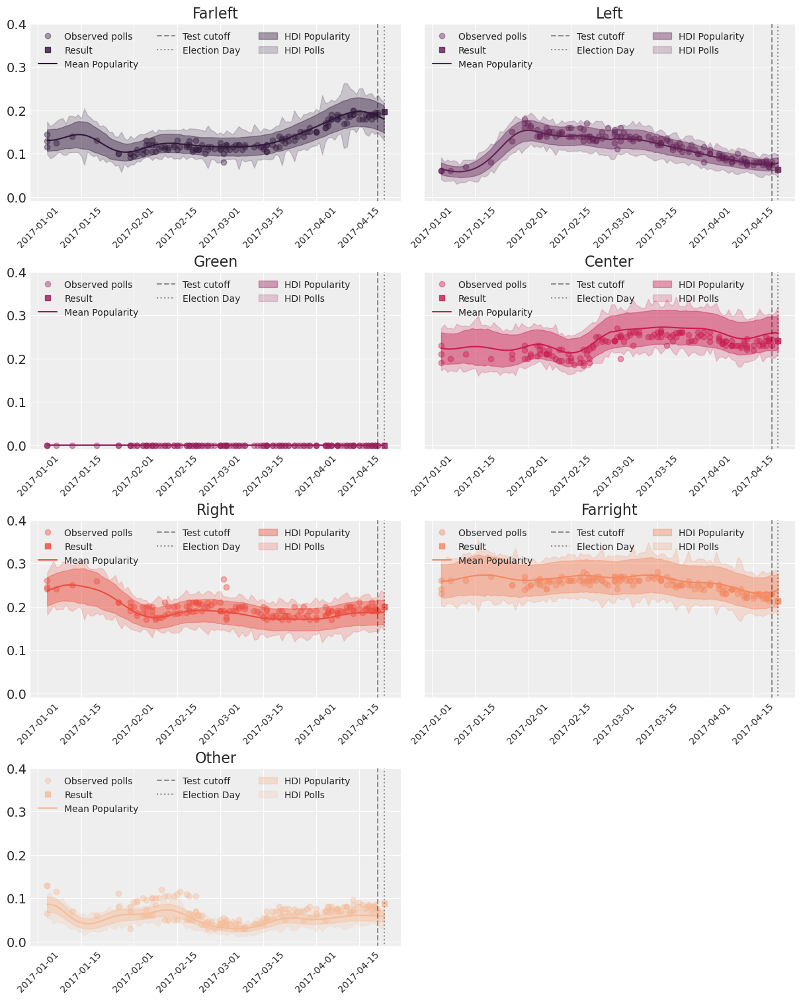

In [5]:
for i in [8, 6, 4, 2, None]:
    if i:
        TEST_CUTOFF = pd.Timedelta(i, "W")
    else:
        TEST_CUTOFF = None
    print(f"{TEST_CUTOFF = }\n")
    
    election_date = "2017-04-23"
    mb = ModelBuilder(
        election_to_predict=election_date,
        test_cutoff=TEST_CUTOFF,
        variance_weight=[0.1, 0.4, 0.5], # [0.1, 0.3, 0.6], [0.2, 0.5, 0.3],
    )
    hierarchical_dm = mb.build_model()

    idata_hierarchical_dm = mb.sample_all(
        var_names=[
            "latent_popularity",
            "latent_pop_t0",
            "R",
            "noisy_popularity",
            "N_approve",
        ],
        draws=2000,
    )

    election_forecast = mb.forecast_election(idata_hierarchical_dm)

    results = mb.results_raw.copy()
    polls_train = mb.polls_train.copy()
    polls_test = mb.polls_test.copy()
    predictive_plot(
        election_forecast,
        mb.parties_complete,
        election_date,
        results[results.dateelection == election_date],
        polls_train[polls_train.dateelection == election_date],
        polls_test[polls_test.dateelection == election_date],
        TEST_CUTOFF,
    )
    if i:
        plt.savefig(f"ppc_{i}_weeks.png")
    else:
        plt.savefig("ppc_2_days.png")

In [71]:
idata_hierarchical_dm.posterior.unemployment_effect.std(dim="parties_complete")

<xarray.DataArray 'unemployment_effect' (chain: 4, draw: 2000)>
array([[0.11466651, 0.08933065, 0.10186055, ..., 0.08828598, 0.08918295,
        0.08390934],
       [0.09424553, 0.13899683, 0.13814128, ..., 0.07630226, 0.13868941,
        0.07933959],
       [0.18909275, 0.05634262, 0.09934032, ..., 0.09994447, 0.08437454,
        0.13261096],
       [0.09602932, 0.12514511, 0.0848668 , ..., 0.09254094, 0.11273249,
        0.07270572]])
Coordinates:
  * chain    (chain) int64 0 1 2 3
  * draw     (draw) int64 0 1 2 3 4 5 6 7 ... 1993 1994 1995 1996 1997 1998 1999

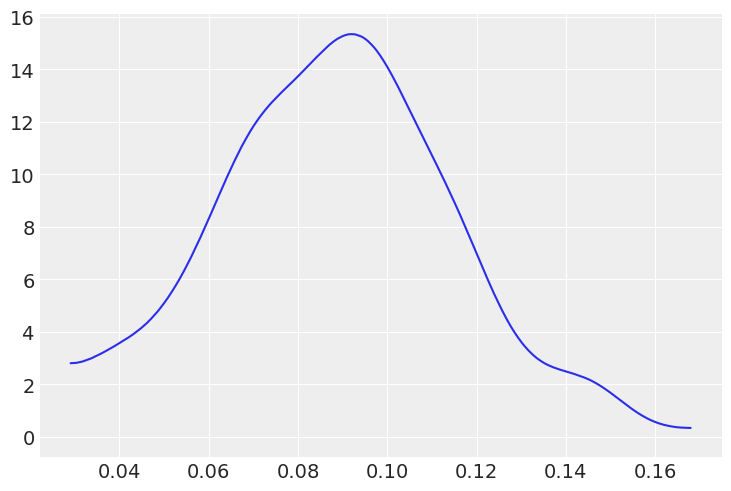

In [79]:
arviz.plot_dist(idata_hierarchical_dm.prior.incumbency_popularity_effect.std(dim="parties_complete"));

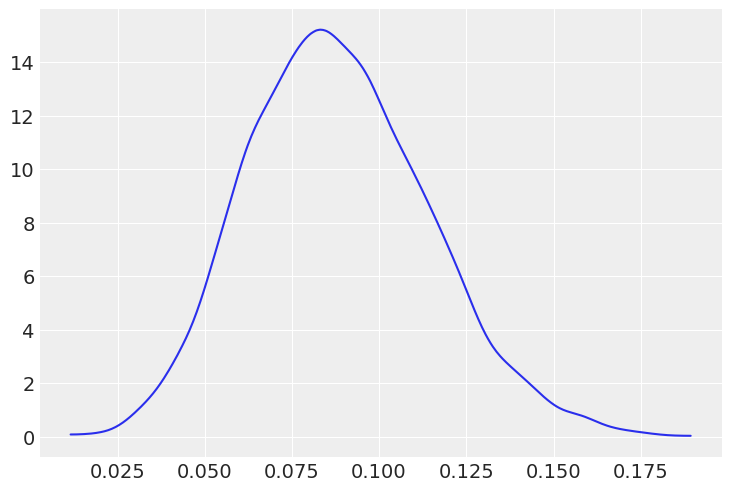

In [80]:
arviz.plot_dist(idata_hierarchical_dm.posterior.incumbency_popularity_effect.std(dim="parties_complete"));

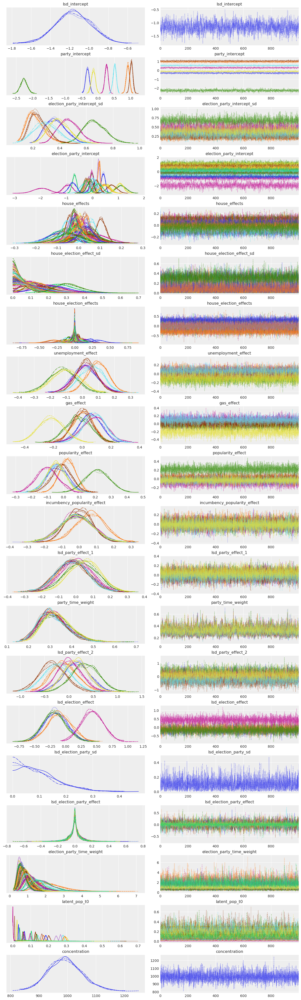

In [26]:
arviz.plot_trace(
    idata_hierarchical_dm,
    var_names=[
        "~time_effect",
        "~time_coefs",
        "~latent_popularity",
        "~noisy_popularity",
        "~raw",
    ],
    filter_vars="regex",
);

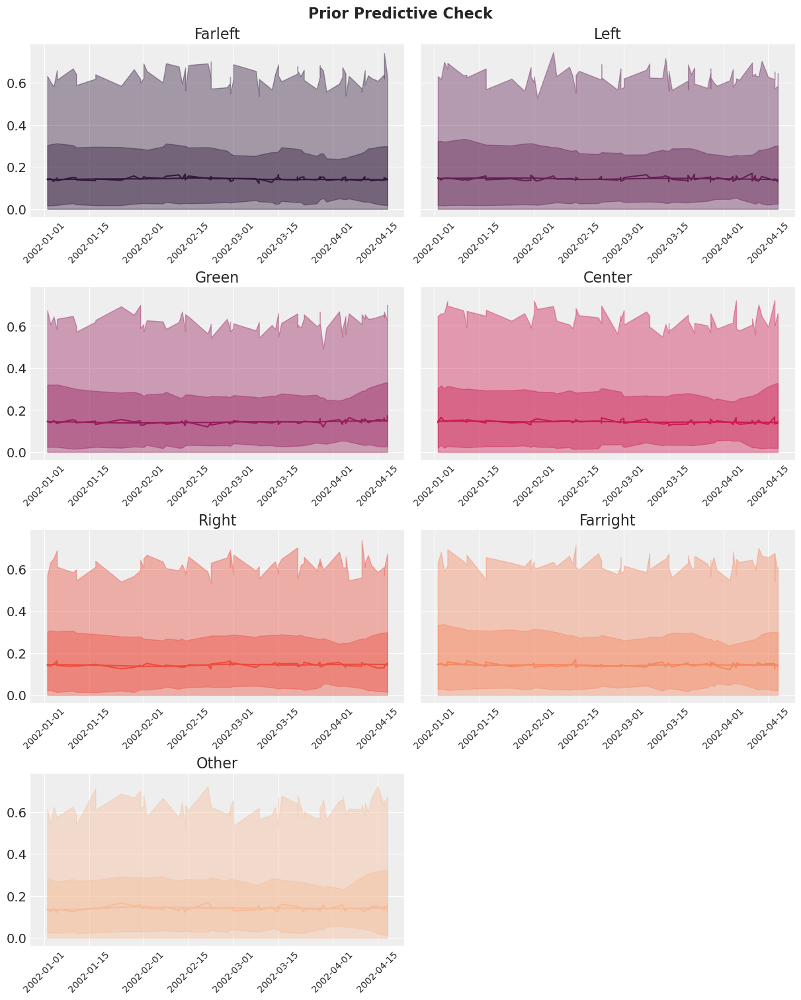

In [63]:
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections="2002-04-21",
        observations=polls_train[polls_train.dateelection == "2002-04-21"].index,
    ),
    PARTIES_COMPLETE,
    polls_train[polls_train.dateelection == "2002-04-21"],
    group="prior",
)

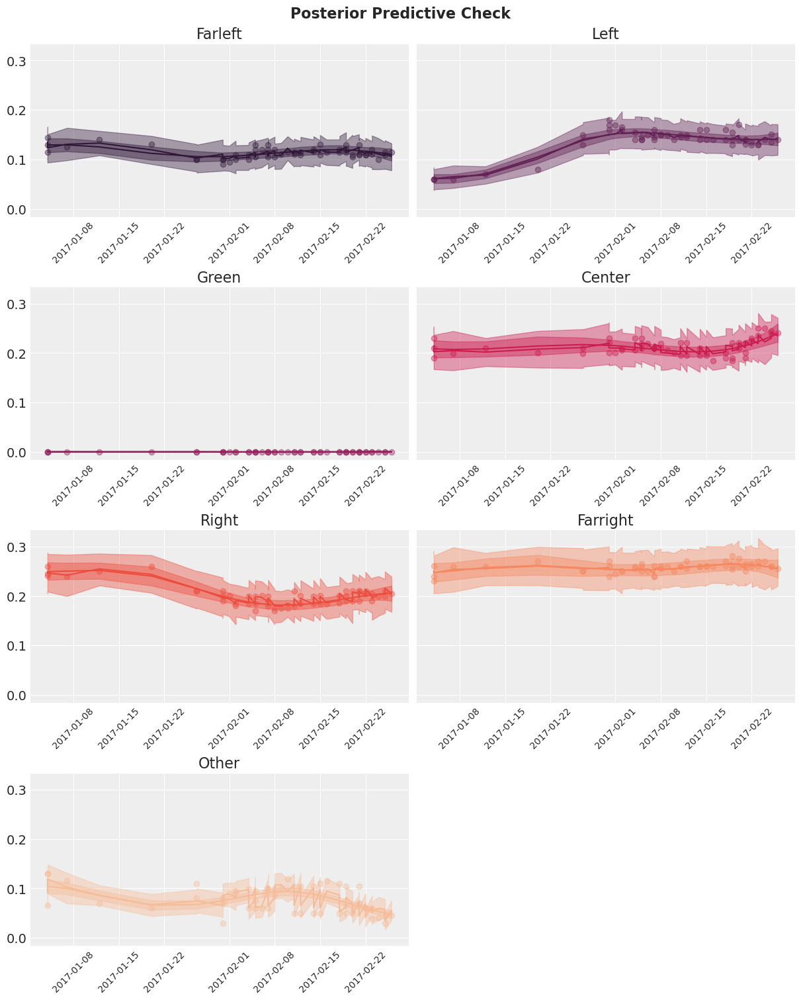

In [27]:
election_date = "2017-04-23"
polls_train = mb.polls_train.copy()
retrodictive_plot(
    idata_hierarchical_dm.sel(
        elections=election_date,
        observations=polls_train[polls_train.dateelection == election_date].index,
    ),
    mb.parties_complete,
    polls_train[polls_train.dateelection == election_date],
    group="posterior",
)

In [28]:
election_forecast = mb.forecast_election(idata_hierarchical_dm)

In [59]:
polls_train.dateelection.unique()

array(['2002-04-21T00:00:00.000000000', '2007-04-22T00:00:00.000000000',
       '2012-04-22T00:00:00.000000000', '2017-04-23T00:00:00.000000000'],
      dtype='datetime64[ns]')

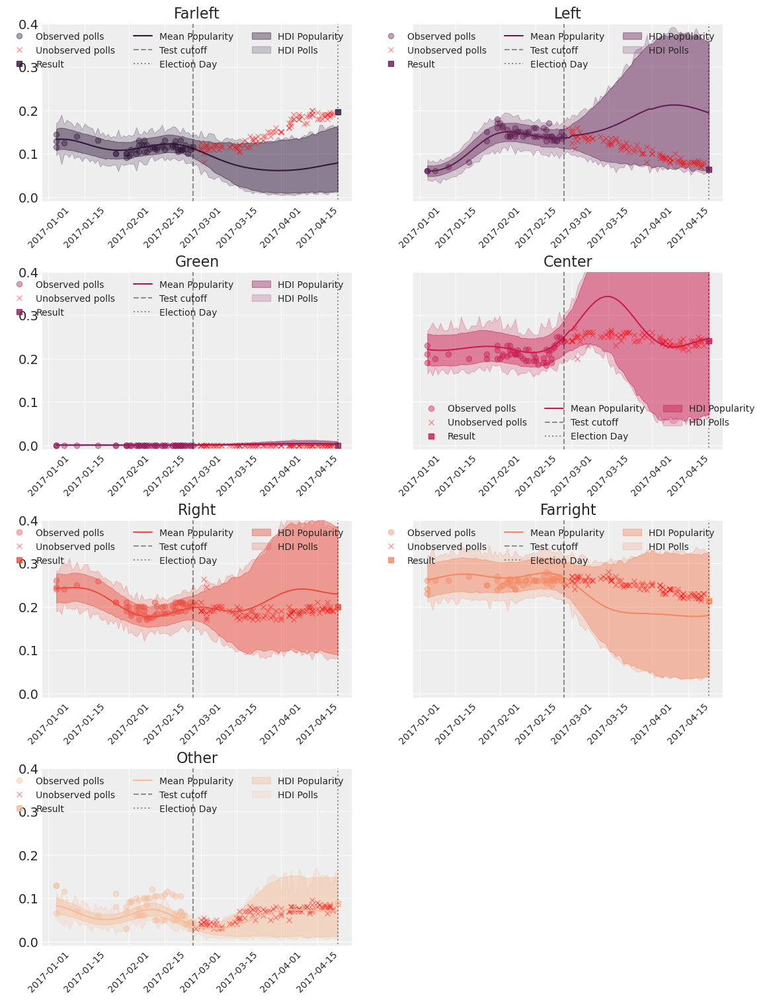

In [29]:
election_date = "2017-04-23"
results = mb.results_raw
polls_test = mb.polls_test

predictive_plot(
    election_forecast,
    mb.parties_complete,
    election_date,
    results[results.dateelection == election_date],
    polls_train[polls_train.dateelection == election_date],
    polls_test[polls_test.dateelection == election_date],
    TEST_CUTOFF,
)
# plt.savefig("ppc.png")

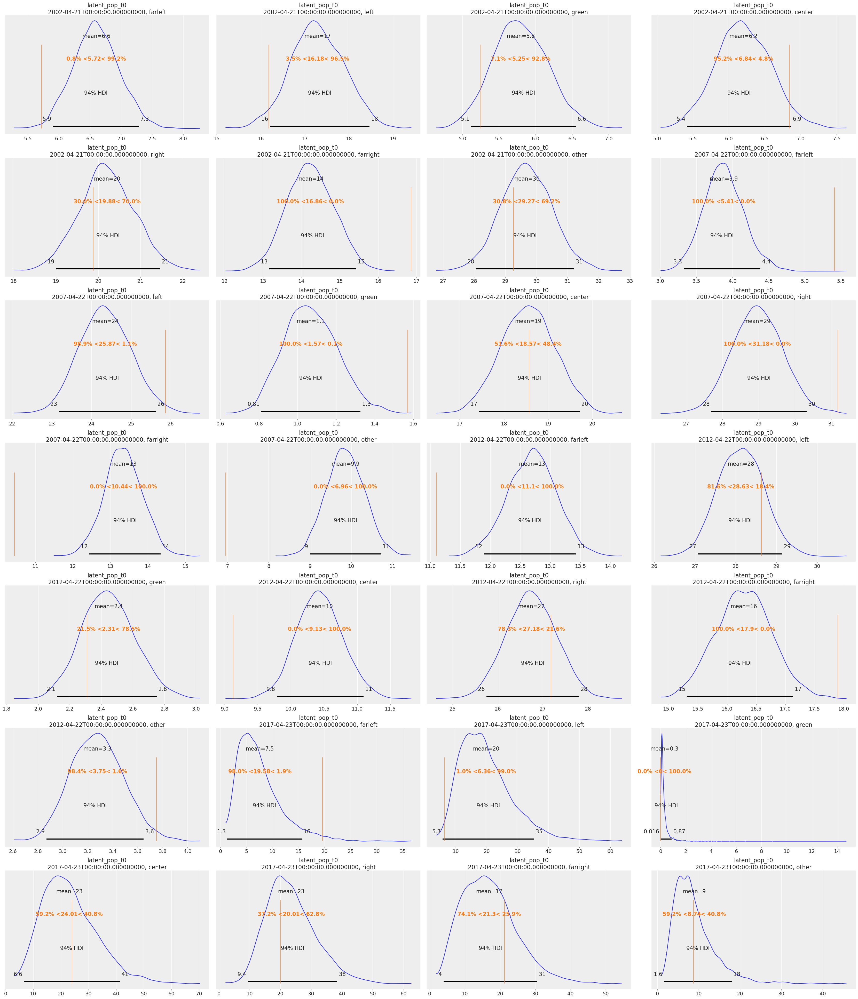

In [30]:
arviz.plot_posterior(
    election_forecast.predictions["latent_pop_t0"] * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
);

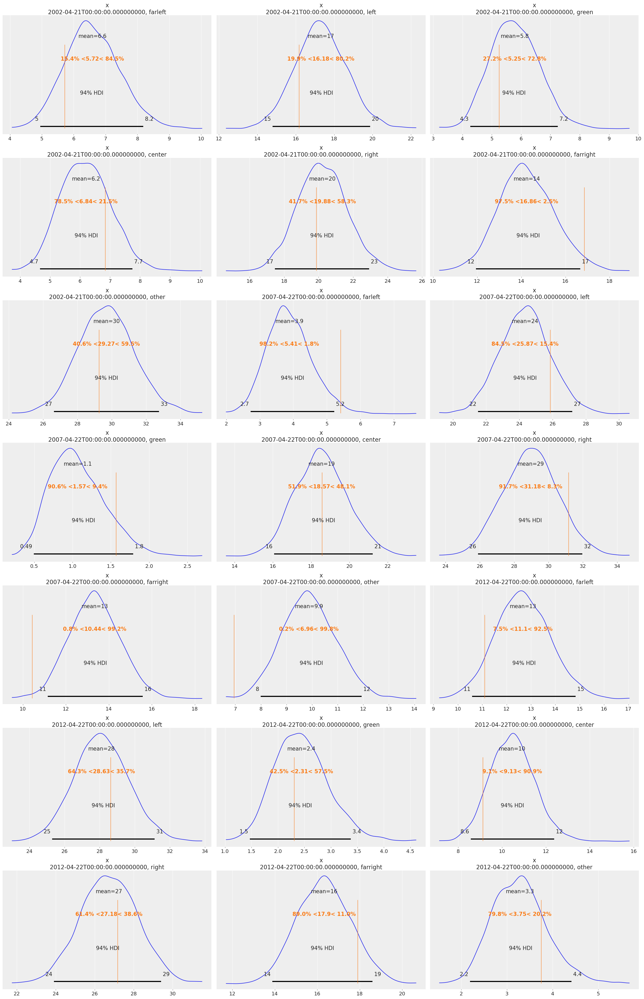

In [32]:
arviz.plot_posterior(
    (
        election_forecast.predictions["R"]
        / election_forecast.predictions_constant_data["results_N"]
    )
    * 100,
    ref_val=results[mb.parties_complete].to_numpy().flatten().tolist(),
)
# plt.savefig("ppc_results.png");

In [26]:
# covarying GP (transition matrix)
# kernel with expanding variance (RW)

In [ ]:
# https://www.itl.nist.gov/div898/handbook/eda/section3/qqplot.htm
# add other election types (https://github.com/pollsposition/models/blob/master/district-level/munic_model_prod.ipynb)